## Images ---> CNN
## NLP ---> Text
## Audio ---> Spectogram
## Video --->Frame by Frame

In [1]:
#STEP 1 ->SETUP

In [1]:
ls

 Volume in drive C is OS
 Volume Serial Number is 744D-9BB4

 Directory of C:\Users\dell\OneDrive\AIandML\Langchain\multimodel_rag

07-03-2025  22:03    <DIR>          .
07-03-2025  11:50    <DIR>          ..
07-03-2025  13:18    <DIR>          .ipynb_checkpoints
07-03-2025  13:18    <DIR>          audios
06-03-2025  23:32        14,902,158 compressed.mp3
06-03-2025  23:11       244,152,911 decision-making-course.mp4
07-03-2025  17:23    <DIR>          frames
07-03-2025  22:03         5,224,018 Multimodel RAG.ipynb
06-03-2025  23:32        59,607,595 output.mp3
07-03-2025  17:05    <DIR>          transcripts
               4 File(s)    323,886,682 bytes
               6 Dir(s)  64,401,453,056 bytes free


[WinError 3] The system cannot find the path specified: 'OneDrive/AIandML/Langchain/multimodel_rag'
C:\Users\dell\OneDrive\AIandML\Langchain\multimodel_rag


C:\Users\dell\OneDrive\AIandML\Langchain\env\Lib\site-packages\IPython\core\magics\osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})


In [2]:
#define the videopath
video_path="decision-making-course.mp4"

# step 3 extract the audio and compress
 

In [5]:
!pip install -q pydub
!apt -get install -q ffmpeg

'apt' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
#import libraries 
import os 
import subprocess
from pydub import AudioSegment

In [4]:
audio_output_path="audios/output.mp3"


In [5]:
#ensure the output directory exists
output_dir=os.path.dirname(audio_output_path)


In [6]:
# Ensure the output directory exists
output_dir = os.path.dirname(audio_output_path)
# Create the directory if it does not already exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [7]:
# Ensure the output file has the correct extension
if not audio_output_path.endswith(".mp3"):
    audio_output_path += ".mp3"

In [8]:
# Construct the ffmpeg command to extract the audio
command = [
    'ffmpeg',
    '-y', # overwrites if the audio exists
    '-i', video_path, # input file
    '-vn', # No video
    '-acodec', 'libmp3lame', # Audio codecs
    audio_output_path # output file
]

In [20]:
!ffmpeg -version


ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
built with gcc 10.2.1 (GCC) 20200726
configuration: --disable-static --enable-shared --enable-gpl --enable-version3 --enable-sdl2 --enable-fontconfig --enable-gnutls --enable-iconv --enable-libass --enable-libdav1d --enable-libbluray --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopus --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libsrt --enable-libtheora --enable-libtwolame --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libzimg --enable-lzma --enable-zlib --enable-gmp --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvo-amrwbenc --enable-libmysofa --enable-libspeex --enable-libxvid --enable-libaom --enable-libgsm --enable-librav1e --disable-w32threads --enable-libmfx --enable-ffnvcodec --enable-cuda-llvm --enable-cuvid --enable-d3d11va --en

In [21]:
# execute the command to extract the audio
subprocess.run(command, shell=True, check=True)

CompletedProcess(args=['ffmpeg', '-y', '-i', 'decision-making-course.mp4', '-vn', '-acodec', 'libmp3lame', 'audios/output.mp3'], returncode=0)

## bitrate is distinct from other measurements tells us video qulaity and frame rate,resolution

In [9]:
# set the bitrate
bitrate="32k" #(more spectograph means more tokens)


In [10]:
# set path for compressed audio
compressed_audio_path="audios/compressed.mp3"


In [24]:
# Construct the ffmpeg command to compress the audio
command = [
    'ffmpeg',
    '-y',                    # Overwrite output file if it exists
    '-i', audio_output_path, # Input audio file path
    '-ab', bitrate,          # Audio bitrate for compression
    compressed_audio_path    # Output compressed audio file path
]

# Execute the ffmpeg command to compress the audio
subprocess.run(command, check=True)

CompletedProcess(args=['ffmpeg', '-y', '-i', 'audios/output.mp3', '-ab', '32k', 'audios/compressed.mp3'], returncode=0)

### The whisper model excels in speech recogniziation,managing accents ,background noise 

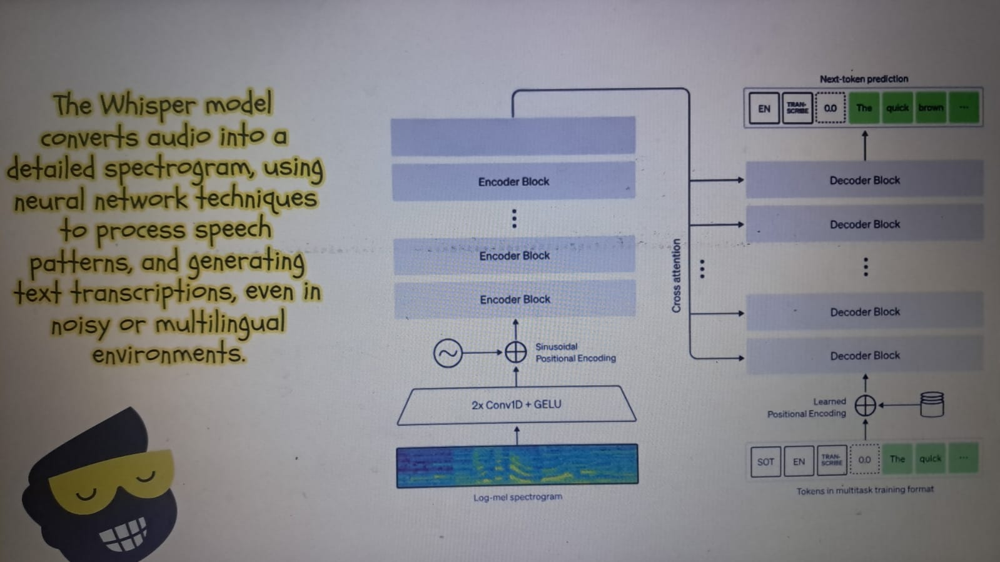


it starts by onverting audio into log-spectogram ,turining into a visual format that ai can analize for capture nauances of speech

1st Layer ---> 1D ConvD +GELU activation function

poisitional encoding

we have encoder blocks  which is used to grab the attention and normalization and everythng same as transformer

cross attention mechanism 

Decoder block uses audio data to predict and generate text sequentially


# Step 4 -Transcribe Audio using OpenAPI

In [25]:
pip install whispercpp



     ---------------------------------------- 0.0/4.0 MB ? eta -:--:--
     ----- ---------------------------------- 0.5/4.0 MB 3.4 MB/s eta 0:00:02
     ------------- -------------------------- 1.3/4.0 MB 3.5 MB/s eta 0:00:01
     --------------------- ------------------ 2.1/4.0 MB 3.8 MB/s eta 0:00:01
     ----------------------- ---------------- 2.4/4.0 MB 3.4 MB/s eta 0:00:01
     ---------------------------- ----------- 2.9/4.0 MB 2.9 MB/s eta 0:00:01
     ---------------------------------- ----- 3.4/4.0 MB 2.9 MB/s eta 0:00:01
     ---------------------------------------- 4.0/4.0 MB 3.1 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for whispercpp: filename=whispercpp-

SyntaxError: invalid syntax (3943527943.py, line 1)

In [28]:
from whispercpp import Whisper

# Load the model using from_pretrained()
whisper_model = Whisper.from_pretrained("small")  # You can change to "tiny", "base", etc.

# Path to your audio file
audio_path = "compressed_audio_path"  # Replace with your actual file path

# Transcribe the audio
transcribed_text = whisper_model.transcribe(audio_path)
print("Transcription:\n", transcribed_text)


ImportError: None (reason: No module named 'whispercpp.api_cpp2py_export')

In [29]:
pip install --force-reinstall --no-cache-dir whispercpp



     ---------------------------------------- 0.0/4.0 MB ? eta -:--:--
     ---------------------------------------- 0.0/4.0 MB ? eta -:--:--
     ---------------------------------------- 0.0/4.0 MB ? eta -:--:--
     ----- ---------------------------------- 0.5/4.0 MB 2.1 MB/s eta 0:00:02
     ---------- ----------------------------- 1.0/4.0 MB 2.3 MB/s eta 0:00:02
     ------------------ --------------------- 1.8/4.0 MB 2.7 MB/s eta 0:00:01
     ----------------------- ---------------- 2.4/4.0 MB 2.8 MB/s eta 0:00:01
     ------------------------------- -------- 3.1/4.0 MB 2.9 MB/s eta 0:00:01
     ------------------------------------ --- 3.7/4.0 MB 2.9 MB/s eta 0:00:01
     ---------------------------------------- 4.0/4.0 MB 3.0 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (py

In [18]:
!pip install -q openai-whisper





In [19]:
import whispercpp
print(whispercpp.__version__)  # Should print the installed version


0.0.17


In [20]:
import whisper

model = whisper.load_model("base")  # You can use "tiny", "base", "small", "medium", or "large"
result = model.transcribe("compressed.mp3")
print(result["text"])


100%|███████████████████████████████████████| 139M/139M [00:44<00:00, 3.29MiB/s]
C:\Users\dell\OneDrive\AIandML\Langchain\env\Lib\site-packages\whisper\transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


KeyboardInterrupt: 

In [21]:
result = model.transcribe("compressed.mp3")
print(result["text"])

 Are you looking to improve the way that you make decisions? Do sometimes worry that you don't have all the tools to make the best calls? Or even when you hear other people at work, you sometimes feel... Hmm, that does not feel like the right decision, but at the same time you cannot explain why. Well, I think you are in the right place. In the next one hour, you will have a crash course on decision making, problem solving, and critical thinking. I'm going to share with you framework thinking how we make decisions and cognitive biases. I'm going to show you some very well known frameworks like System 1 and System 2 thinking, loss of version, and even some cognitive biases like anchoring bias or confirmation bias. By the end of this one hour, you will have better tools to make decisions. And at the same time, just to give you some notch to actually complete, there is a very nice incentive. So I have a tiny gift for you at the end of this crash course. Are you ready? Let's get started. A

In [8]:
# Define the path where the transcription will be saved
transcript_path = "transcripts/transcript.txt"

In [23]:
# Ensure the output directory exists
output_dir = os.path.dirname(transcript_path)
# Create the directory if it does not already exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [27]:
# Save the transcribed text to a file
with open(transcript_path, "w") as file:
  file.write(result["text"]) # .text is the attribute from transcrition

In [26]:
# # Save the transcribed text without using "with"
file = open(transcript_path, "w")
file.write()
file.close()

NameError: name 'transcript' is not defined

# step -5 extract frames from the video

In [28]:
# Install the moviepy library to handle video data
!pip install -q moviepy

In [30]:
from moviepy import VideoFileClip

In [31]:
# Define the output folder for storing frames
output_folder = "frames"
# Create the folder if it does not already exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

In [32]:
video=VideoFileClip(video_path)

{'video_found': True, 'audio_found': True, 'metadata': {'major_brand': 'mp42', 'minor_version': '0', 'compatible_brands': 'isommp42', 'creation_time': '2024-01-19T10:30:34.000000Z'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [1280, 720], 'bitrate': 393, 'fps': 30.0, 'codec_name': 'h264', 'profile': '(High)', 'metadata': {'Metadata': '', 'creation_time': '2024-01-19T10:30:34.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 01/19/2024.', 'vendor_id': '[0][0][0][0]'}}, {'input_number': 0, 'stream_number': 1, 'stream_type': 'audio', 'language': None, 'default': True, 'fps': 44100, 'bitrate': 127, 'metadata': {'Metadata': '', 'creation_time': '2024-01-19T10:30:34.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 01/19/2024.', 'vendor_id': '[0][0][0][0]'}}], 'input_number': 0}], 'duration': 3725.41, 'bitrate': 524, 'start': 0.0, 'default_video_inpu

In [33]:
frame_paths=[]
interval=10
for t in range(0,int(video.duration),interval):
    frame_path=os.path.join(output_folder,f"frame_{t:04d}.png")
    #save the frame at the specificd time
    video.save_frame(frame_path,t)
    frame_paths.append(frame_path)
    

{'video_found': True, 'audio_found': True, 'metadata': {'major_brand': 'mp42', 'minor_version': '0', 'compatible_brands': 'isommp42', 'creation_time': '2024-01-19T10:30:34.000000Z'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [1280, 720], 'bitrate': 393, 'fps': 30.0, 'codec_name': 'h264', 'profile': '(High)', 'metadata': {'Metadata': '', 'creation_time': '2024-01-19T10:30:34.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 01/19/2024.', 'vendor_id': '[0][0][0][0]'}}, {'input_number': 0, 'stream_number': 1, 'stream_type': 'audio', 'language': None, 'default': True, 'fps': 44100, 'bitrate': 127, 'metadata': {'Metadata': '', 'creation_time': '2024-01-19T10:30:34.000000Z', 'handler_name': 'ISO Media file produced by Google Inc. Created on: 01/19/2024.', 'vendor_id': '[0][0][0][0]'}}], 'input_number': 0}], 'duration': 3725.41, 'bitrate': 524, 'start': 0.0, 'default_video_inpu

 ## Contrative Learning aligns different data types,helping AI generate more releveant content

 It teachs AI to process both images and audio

 CLIP MODEL --->Contrasting Language Image Pretraining(similar to image caption generator)


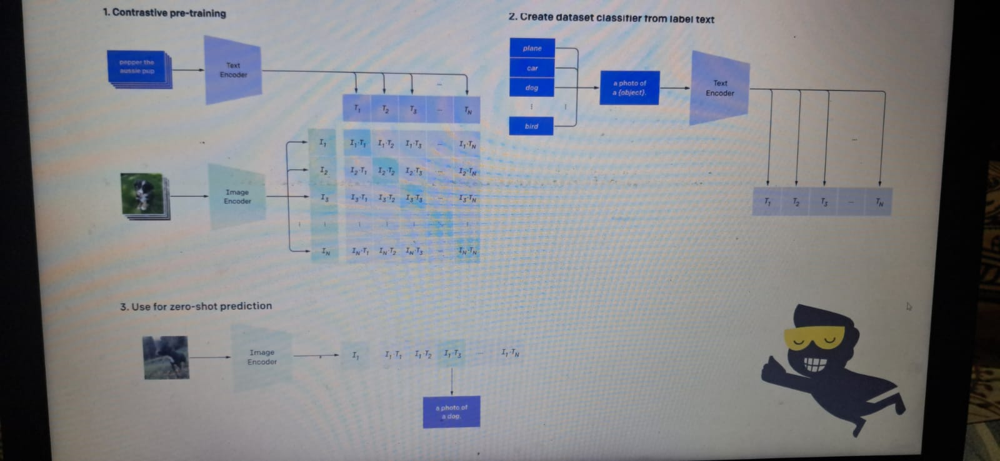

CLIP learns to match text and images by minimizing the distance between the correct image-text pairs and maximizing the distance between incorrect ones

The model matches text and image embeddings , identify the closest image as the correct category

### Zero shot Prediction :  An unseen image is processed and compared with the  text embeddings from descriptions. Zero-shot prediction (or zero-shot learning) is a type of machine learning approach where a model can make predictions on tasks or classes it has never seen during training.



## STEP -6 Embedding Audio

In [5]:
# Import libraries
from transformers import CLIPProcessor, CLIPModel, CLIPTokenizer
import torch
import numpy as np

In [6]:
#load the Model ,Procsser and Tokenizer
# Load the Model, Processor and Tokenizer
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")

In [9]:
# Read the transcribed text from the file
with open(transcript_path, "r") as file:
  transcript_text = file.read()

In [10]:
# Tokenize the entire transcript text
tokens = tokenizer(transcript_text,
                   return_tensors="pt",  # Return tensors for PyTorch
                   padding=True)         # Pad sequences to the same length

# Extract the input_ids from the tokenized output
tokens = tokens['input_ids'][0]

# Print the number of tokens
print(f"The number of tokens is {len(tokens)}")

Token indices sequence length is longer than the specified maximum sequence length for this model (9825 > 77). Running this sequence through the model will result in indexing errors


The number of tokens is 9825


In [11]:
# The clip model requires 77 tokens per chunk

max_tokens = 77
transcription_chunks = []

# Split the tokens into chunks of up to max_tokens tokens each
for i in range(0, len(tokens), max_tokens):
    chunk = tokens[i:i+max_tokens]
    transcription_chunks.append(chunk)

# Print the number of chunks created
print(f"The number of chunks is {len(transcription_chunks)}")

The number of chunks is 128


In [12]:
transcription_chunks

[tensor([49406,   631,   592,  1312,   531,  4971,   518,   923,   682,   592,
          1078,  9903,   286,   818,  4237,  7534,   682,   592,   847,   713,
           720,   615,   518,  5771,   531,  1078,   518,   949,  4572,   286,
           541,  1427,   827,   592,  2584,  1010,  1047,   536,   951,   267,
           592,  4237,  2051,   678, 13725,   267,   682,  1897,   783,  2051,
           789,   518,  1155,  5575,   267,   767,   536,   518,  2208,   788,
           592,  4785,  7304,  1182,   269,  1123,   267,   328,  1331,   592,
           631,   530,   518,  1155,  1445,   269,   530]),
 tensor([  518,  1131,   637,  2232,   267,   592,   751,   720,   320,  5033,
          2613,   525,  5575,  1665,   267,  4324, 15581,   267,   537,  6808,
          3291,   269,   328,   880,  1245,   531,  1978,   593,   592, 13195,
          3291,   829,   649,  1078,  9903,   537, 16584,   717,  3762,   269,
           328,   880,  1245,   531,  1080,   592,   836,  1070,  1123,

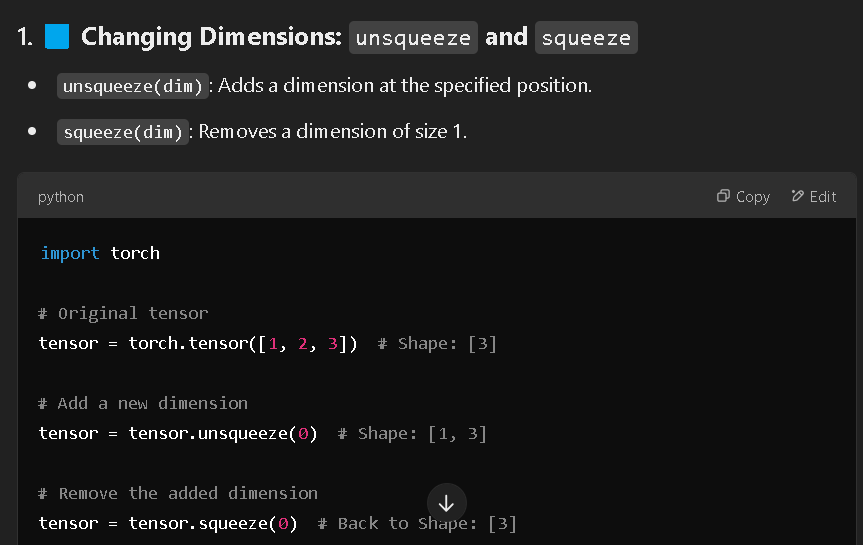 UNSequeeze and squeeze

In [22]:
#Text Embeddings ----> embed the tokens in each chunk
# Text Embeddings -> embed the tokens in each chunk
text_embeddings = []

for chunk in transcription_chunks:
  # Ensure the chunk is in the correct shape for the model
  inputs = {"input_ids": chunk.unsqueeze(0)}

  # Get the text embedding for the chunk
  with torch.no_grad():
    text_embedding = model.get_text_features(**inputs)
text_embedding

tensor([[ 7.3838e-02,  7.9927e-02, -5.9824e-02,  1.6681e-02, -1.2184e-01,
          8.9555e-02,  7.7102e-02,  7.5359e-01,  3.4474e-01, -2.6184e-02,
         -6.6256e-02,  3.7533e-01, -7.9520e-02,  2.4950e-01, -9.6525e-02,
          3.3059e-01, -3.6675e-01, -1.2180e-01, -2.2938e-01,  1.4027e-01,
          1.7449e-02, -2.2797e-01, -1.5022e-01, -1.0861e-01,  3.9900e-02,
         -4.7353e-01, -1.8824e-01, -6.9526e-02, -4.4006e-02, -3.1419e-01,
         -2.5096e-01, -1.3009e-01, -3.3811e-01,  3.2878e-01, -4.5544e-02,
         -4.7463e-02,  1.1235e-01,  1.9150e-01, -3.1388e-01, -1.8524e-02,
         -1.2185e-02,  3.3420e-02, -5.2155e-02,  3.1008e-01, -1.6951e-02,
         -4.4048e-02,  8.0704e-03,  5.4812e-02,  1.8449e-01, -1.2663e-02,
         -3.5364e-02, -2.4474e-02, -6.1972e-02, -3.2637e-01, -3.8879e-02,
          1.7353e-01,  2.5856e-02,  5.0304e-02, -1.9528e-01,  9.0864e-02,
          1.9325e-01,  2.9576e-01, -4.2330e-03,  8.9718e-02, -2.3555e-01,
         -1.0280e-02, -2.8938e-01,  2.

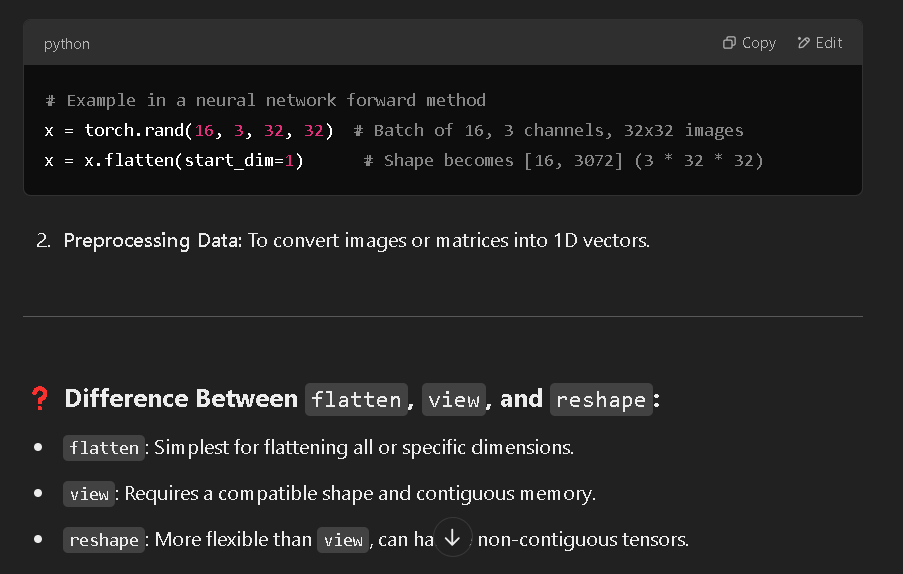

# Flatten is used to convert layers to MLP (Neural network)

In [13]:
# Text Embeddings -> embed the tokens in each chunk
text_embeddings = []

for chunk in transcription_chunks:
  # Ensure the chunk is in the correct shape for the model
  inputs = {"input_ids": chunk.unsqueeze(0)}

  # Get the text embedding for the chunk
  with torch.no_grad():
    text_embedding = model.get_text_features(**inputs)
    # Convert the embedding to a numpy array and flatten it<======= ses here
    text_embeddings.append(text_embedding.cpu().numpy().flatten())
# Convert the list of embeddings to a numpy array
text_embedding_np = np.array(text_embeddings)

# Print the shape of the text embeddings array
print(f"Text embedding shape is {text_embedding_np.shape}")

Text embedding shape is (128, 512)


In [14]:
text_embedding_np

array([[ 0.02291097,  0.06127315, -0.10674022, ...,  0.180324  ,
         0.03520007,  0.00395092],
       [ 0.18618876,  0.17673641,  0.08763488, ..., -0.26088893,
        -0.19151998, -0.06756917],
       [ 0.10644696, -0.18286023,  0.16647941, ...,  0.3118079 ,
         0.12920843,  0.03040832],
       ...,
       [-0.00815287, -0.21321644,  0.24832438, ...,  0.20221932,
        -0.23889382, -0.23899077],
       [ 0.6619987 , -0.06897983,  0.3168215 , ..., -0.04406229,
        -0.13533004,  0.16151126],
       [ 0.07383803,  0.07992737, -0.05982406, ..., -0.85882485,
        -0.15930405, -0.20278582]], dtype=float32)

# Step 7 - Embedding the images

In [15]:
from PIL import Image


In [16]:
# Embed the images
frames_folder = "frames"
image_embeddings = []
image_paths=[]

for frame_file in os.listdir(frames_folder):
    if frame_file.endswith('.png'):
        frame_path=os.path.join(frames_folder,frame_file)
        image_paths.append(frame_path)

        #load and preprocess the image
        image=Image.open(frame_path)
        inputs=processor(images=image,return_tensors="pt")
        
        # Generate the image embeddings
        with torch.no_grad():
            image_embedding=model.get_image_features(**inputs)
            image_embeddings.append(image_embedding.cpu().numpy().flatten())
            

#convert the list of embeddings to  a numpy array
image_embedding_np=np.array(image_embeddings)


# Print the shape
print(f"Image embedding shape is {image_embedding_np.shape}")        
        
    

Image embedding shape is (373, 512)


In [17]:
image_embedding_np

array([[-0.22940022,  0.01597312,  0.03206813, ...,  0.00915501,
         0.07985998,  0.19076163],
       [-0.33714956,  0.02241179, -0.02278338, ...,  0.16539606,
         0.1047114 ,  0.11467946],
       [-0.21932316,  0.05551606, -0.05949491, ...,  0.10593358,
         0.11666597,  0.27687374],
       ...,
       [-0.24118498,  0.0223791 , -0.03057025, ...,  0.32791722,
         0.08050713,  0.15384881],
       [-0.31246498,  0.00561149, -0.02696356, ...,  0.23467392,
         0.12491331,  0.07577625],
       [-0.24419117,  0.0545138 , -0.02533498, ...,  0.24466734,
         0.05816132,  0.20555654]], dtype=float32)

# COSINE SIMILARITY

### Coseine similarity is a powerful method to understand the relationship between data types

### It checks or measures the angle between two vectors in multimodel dimensional space

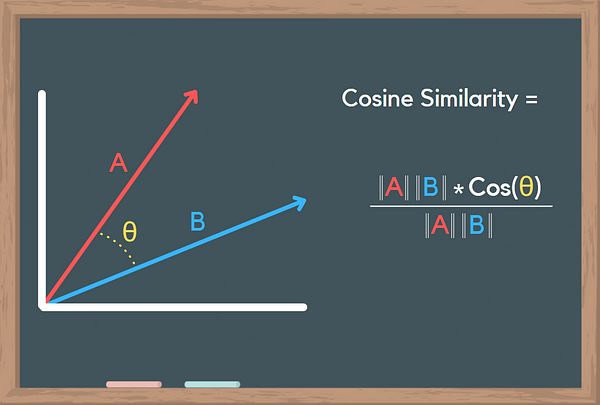

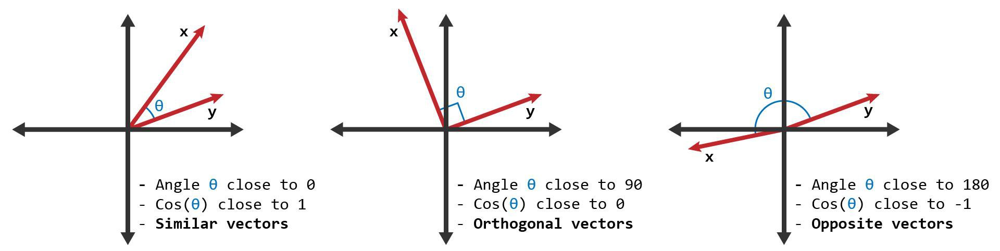

# Step - 8 Contrastive learning 

In [18]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import random

In [19]:
# caluclate the cosine similarity matrix
similarities = cosine_similarity(text_embedding_np,image_embedding_np)

similarities

array([[0.20486283, 0.2061564 , 0.20594826, ..., 0.21184063, 0.2086494 ,
        0.20364201],
       [0.16592132, 0.15452547, 0.15736806, ..., 0.16507217, 0.1583691 ,
        0.1693885 ],
       [0.15443188, 0.15762696, 0.15217918, ..., 0.15276876, 0.15668328,
        0.15133287],
       ...,
       [0.172374  , 0.16988727, 0.16744956, ..., 0.16431151, 0.17743753,
        0.16145347],
       [0.16262472, 0.16362518, 0.156672  , ..., 0.16912752, 0.16247642,
        0.15936987],
       [0.21871583, 0.21581143, 0.21696767, ..., 0.21814808, 0.21560025,
        0.21898246]], dtype=float32)

In [20]:
 # Check the shape of the similarities
print(f"The shape of the similarities is {similarities.shape}")

The shape of the similarities is (128, 373)


In [21]:
#Retrive the top k similar images for each text chunk
top_k=5
for i,text_chunk in enumerate(similarities):
    similar_indices = text_chunk.argsort()[-top_k:][::-1]
    print(f"Top {top_k} images for each chunk {i}: {similar_indices}")

Top 5 images for each chunk 0: [ 94 300 258  21  34]
Top 5 images for each chunk 1: [ 10 233 204 198 203]
Top 5 images for each chunk 2: [ 65  77 359 326 196]
Top 5 images for each chunk 3: [ 12  13  11 178 149]
Top 5 images for each chunk 4: [ 12  80 325  63 266]
Top 5 images for each chunk 5: [ 17 333 371 327 337]
Top 5 images for each chunk 6: [332 104 224 226 200]
Top 5 images for each chunk 7: [200   9 304  13  27]
Top 5 images for each chunk 8: [323 324 357 351  69]
Top 5 images for each chunk 9: [351  11 352 179 135]
Top 5 images for each chunk 10: [331 330 259 262 260]
Top 5 images for each chunk 11: [202  13   9 212 358]
Top 5 images for each chunk 12: [ 79  78 346 352 351]
Top 5 images for each chunk 13: [ 11  12  13 329 256]
Top 5 images for each chunk 14: [203 204 337 341 259]
Top 5 images for each chunk 15: [264 265 245  14 304]
Top 5 images for each chunk 16: [ 14 206  46 205 371]
Top 5 images for each chunk 17: [325 206   7 204 203]
Top 5 images for each chunk 18: [ 52  

In [22]:
# set a random seed for reproducibility
random.seed(42)

#select 5 random text chunk indices
random_text_indices = random.sample(range(len(text_embedding_np)), 5)
print(f"Random text chunk indices: {random_text_indices}")

Random text chunk indices: [28, 6, 70, 62, 57]


In [23]:
# FIND the 3  most similar images for each text
text_to_images_similarites=[]
for idx in random_text_indices:
    similar_images=similarities[idx].argsort()[-3:][::-1]
    text_to_images_similarites.append(similar_images)

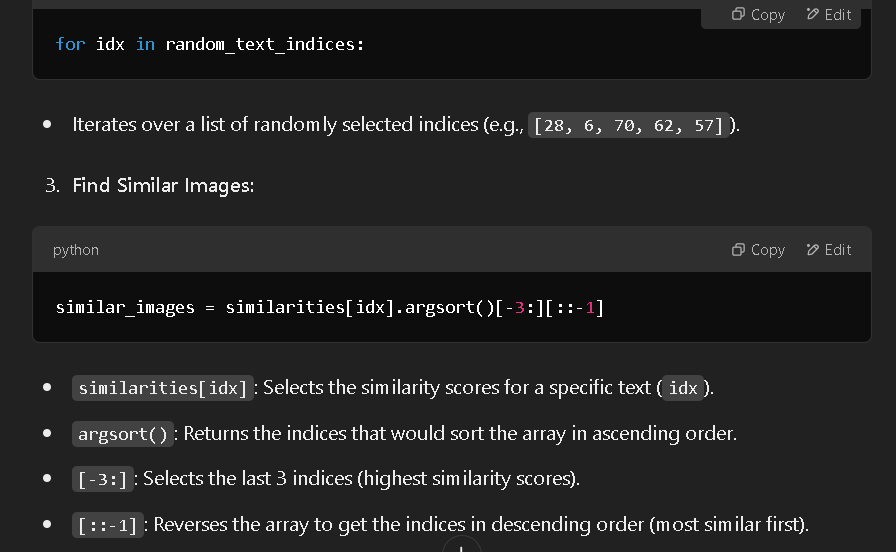


      The text chunk 1: as a potential gain , companies can help employees and customers to see the benefits of the change and overcome their loss a version . for example , a company might highlight how a new process will improve efficiency and save time , rather than focusing on the loss of the old process . by presenting change in a positive light , companies can encourage employees and customers to embrace it and move forward . in conclusion

      The text chunk 2: scenario . you have put a lot of hard work and dedication into starting your new retail business , selling uni que and handcrafted jewelry . you carefully selected a prime location for your store and hired a team of knowledgeable and friendly employees to help run the day - to - day operations . you are confident that your products , which are handcrafted with love and attention to detail , would be hit with customers

      The text chunk 3: is the key to making better decisions and leading a more fulfilling life . i c

<function matplotlib.pyplot.show(close=None, block=None)>

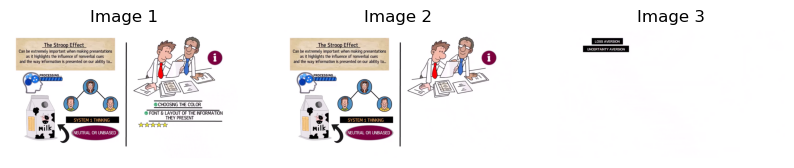

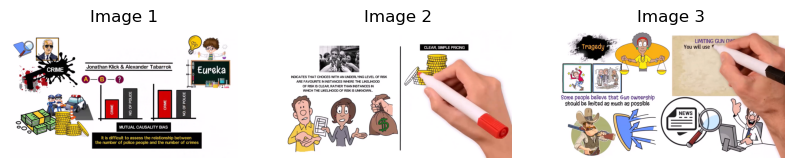

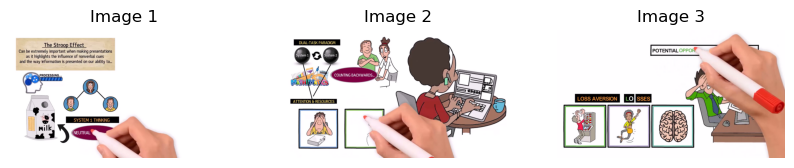

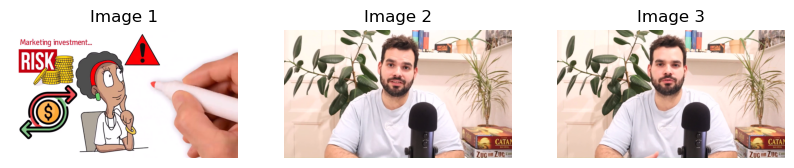

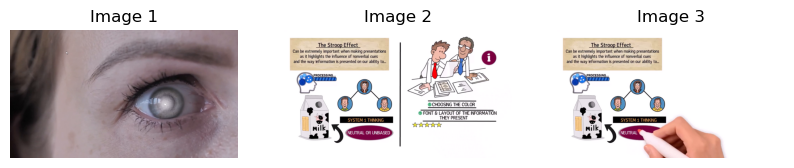

In [25]:
#Data visulaiztion of the text and images
for i ,text_index in enumerate(random_text_indices):
    plt.figure(figsize=(10,8))

    #display the text chunk
    print(f"""
      The text chunk {i + 1}: {' '.join([tokenizer.decode([token]) for token in transcription_chunks[text_index]]
      )}""")

    #display the similar images
    for j,image_idx in enumerate(text_to_images_similarites[i]):
        image=Image.open(image_paths[image_idx])
        plt.subplot(1,3,j+1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image {j + 1}")
        

plt.show


  The text chunk 1: as a potential gain , companies can help employees and customers to see the benefits of the change and overcome their loss a version . for example , a company might highlight how a new process will improve efficiency and save time , rather than focusing on the loss of the old process . by presenting change in a positive light , companies can encourage employees and customers to embrace it and move forward . in conclusion


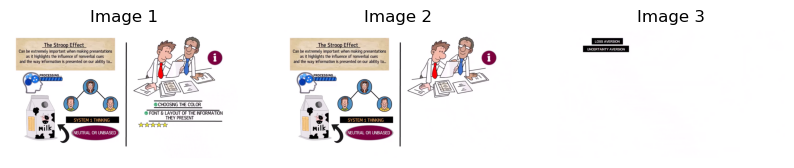


  The text chunk 2: scenario . you have put a lot of hard work and dedication into starting your new retail business , selling uni que and handcrafted jewelry . you carefully selected a prime location for your store and hired a team of knowledgeable and friendly employees to help run the day - to - day operations . you are confident that your products , which are handcrafted with love and attention to detail , would be hit with customers


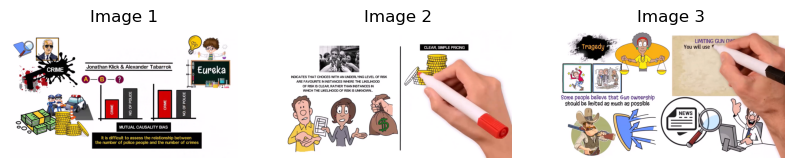


  The text chunk 3: is the key to making better decisions and leading a more fulfilling life . i couldn 't agree more by exploring real examples and case studies will gain a deeper understanding of these bi ases and how they can impact us , whether it 's the linear bias causing us to make overly simpli stic predictions or the selection bias leading us to ove rest im ate the success of ivy lee graduates . we 'll see


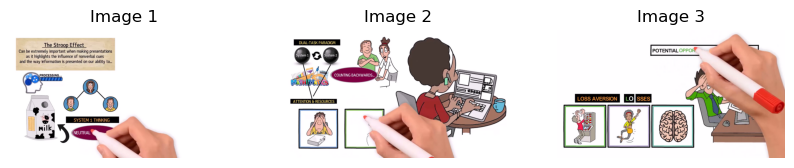


  The text chunk 4: how companies can use the concept of marginal utility to optimize their pricing and commercial strategies . for example , if a company knows that the utility a customer gets from its products decre ases with each additional unit they consume , they can price each unit higher to reflect that . next up , we have the prisoners dilemma experiments where two individuals are put in a situation they have to choose between cooperation and competition


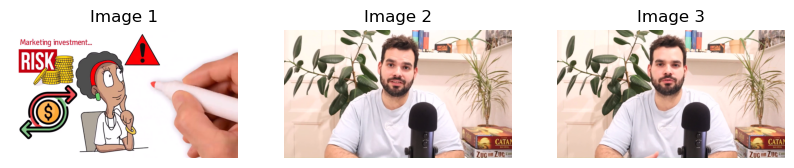


  The text chunk 5: product before . that 's the halo effect at work . to avoid it in marketing , it 's important to focus on product quality and clearly communicate the benefits and features to customers . in conclusion , the halo effect is a fascinating and powerful psychological bias that can affect our decisions and perceptions . so next time you 're about to make a judgement , take a step back and ask yourself if you 're


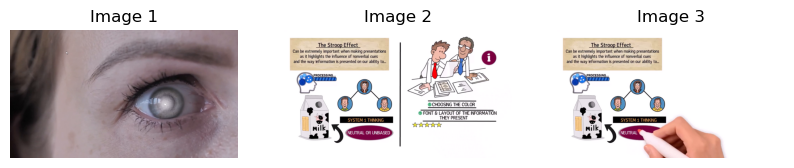

In [27]:
# Data visualization of the text and images
for i, text_index in enumerate(random_text_indices):
  plt.figure(figsize = (10,8))

   # Displaying the text chunk
  print(f"""
  The text chunk {i + 1}: {' '.join([tokenizer.decode([token]) for token in transcription_chunks[text_index]]
  )}""")

  # Displaying similar images corresponding to the current text chunk
  for j, image_idx in enumerate(text_to_images_similarites[i]):
    image = Image.open(image_paths[image_idx])
    plt.subplot(1, 3, j + 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image {j + 1}")

  plt.show() # Show the plot with images and text

# Step 9 - Retrival System

In [28]:
# lets define a query
query="Which cognitive biases are discussed ?"


In [29]:
# tokenize the query
query_tokens=tokenizer(query,return_tensors="pt",padding=True)['input_ids']


In [30]:
query_tokens

tensor([[49406,  1448, 16584,   717,  3762,   631, 11300,   286, 49407]])

In [31]:
# Generate the query embeddings in the join embedding space
# use the clip model
with torch.no_grad():
    query_embedding = model.get_text_features(
      input_ids = query_tokens  # Pass tokenized query to model
          ).cpu().numpy().flatten()   
# Print shape of the embedding
print(f"The shape of the query embedding is {query_embedding.shape}")

The shape of the query embedding is (512,)


In [35]:
# compute the cosise similarity between the query and the transcripts
text_similarity=cosine_similarity([query_embedding],text_embedding_np)[0]
text_similarity

array([0.7514169 , 0.3959385 , 0.5216031 , 0.23942317, 0.5027398 ,
       0.50528795, 0.18525761, 0.39712432, 0.55935705, 0.44633824,
       0.5580021 , 0.3517962 , 0.43620855, 0.36107063, 0.3534228 ,
       0.37692374, 0.48611546, 0.37017012, 0.33236453, 0.312824  ,
       0.36358353, 0.47394532, 0.38215467, 0.3532689 , 0.15768468,
       0.7641123 , 0.33989218, 0.6079247 , 0.6504968 , 0.49446577,
       0.35436282, 0.37858263, 0.13069206, 0.31700963, 0.45355064,
       0.2881801 , 0.41618404, 0.50012994, 0.47722733, 0.44057694,
       0.30410045, 0.40386906, 0.3860364 , 0.5071679 , 0.52253366,
       0.49751884, 0.4825793 , 0.49849942, 0.4091322 , 0.50872606,
       0.5273764 , 0.47267038, 0.36624944, 0.20002478, 0.45181122,
       0.4161163 , 0.5540109 , 0.5796427 , 0.39158365, 0.52394927,
       0.30484402, 0.45643255, 0.5576651 , 0.40665257, 0.34894484,
       0.4918269 , 0.24552196, 0.38215008, 0.48387593, 0.46948892,
       0.4345181 , 0.42111596, 0.09006467, 0.26805604, 0.43278

In [36]:
#define how many chunks we want
top_k_texts=10

#Retrieve the indices of the top - k most similar texts
top_k_text_indices=text_similarity.argsort()[-top_k_texts:][::-1]
top_k_text_indices

array([127,  25,   0,  28,  91, 113, 102,  27,  57, 118])

In [37]:
#retrive the closest images fro each text chunk
top_k_images_indices=[]
images_per_chunk = 2 # Number of top similar images to retrieve for each text chunk

for idx in top_k_text_indices:
  # Find indices of the top-k similar images for the current text chunk
  similar_images = similarities[idx].argsort()[-images_per_chunk:][::-1]
  top_k_images_indices.append(similar_images)  # Add to the list

#remove any duplicate and limit to the top k images
top_k_images_indices = list(set([item for sublist in top_k_images_indices for item in sublist]))
top_k_images_indices

[np.int64(65),
 np.int64(226),
 np.int64(66),
 np.int64(100),
 np.int64(101),
 np.int64(134),
 np.int64(135),
 np.int64(68),
 np.int64(73),
 np.int64(42),
 np.int64(43),
 np.int64(300),
 np.int64(201),
 np.int64(14),
 np.int64(178),
 np.int64(94),
 np.int64(223)]

In [38]:
# Retrieve the closest images for each text chunk
top_k_images_indices = []
images_per_chunk = 2 # Number of top similar images to retrieve for each text chunk

for idx in top_k_text_indices:
  # Find indices of the top-k similar images for the current text chunk
  similar_images = similarities[idx].argsort()[-images_per_chunk:][::-1]
  top_k_images_indices.append(similar_images)  # Add to the list

# Remove any duplicates and limit to the top k images
top_k_images_indices = list(set([item for sublist in top_k_images_indices for item in sublist]))

# Print the number of unique image indices
print(f"The total images indices are {len(top_k_images_indices)}")

The total images indices are 17


# step 10 Geneartion system

In [39]:
import base64

In [40]:
# Combining the retrieved text chunks
retrieved_text = []

for idx in top_k_text_indices:
  # Decode and append each text chunk using the tokenizer
  retrieved_text.append(tokenizer.decode(transcription_chunks[idx]))

# Join all the text chunks into a single string
retrieved_text = ' '.join(retrieved_text)
retrieved_text

", hmm , this is actually important . would you share it with me ? if you have any stories on decision making that you think are thought provoking or interesting , please do share . i love to hear other people 's stories . <|endoftext|> undergo a medical procedure . the twist is that this scenario is presented in two different frames , or ways . for example , in one frame , the procedure is described as a potential gain . if they do it , 2 0 0 people will be saved . and while the other , it is described as a potential loss . 8 0 0 people will die . the results consistently show that people are <|startoftext|>are you looking to improve the way that you make decisions ? do sometimes worry that you don 't have all the tools to make the best calls ? or even when you hear other people at work , you sometimes feel ... hmm , that does not feel like the right decision , but at the same time you cannot explain why . well , i think you are in the right place . in as a potential gain , companies 

In [41]:
# Convert the images and append them
base64frames = []

for idx in top_k_images_indices:
  image_path = image_paths[idx]  # Get the path of the image

  # Open the image file in binary read mode
  with open(image_path, "rb") as image_file:
    # Encode the image file content to base64 and decode to UTF-8 string
    base64_image = base64.b64encode(image_file.read()).decode('utf-8')
    base64frames.append(base64_image) # Append the encoded image string to the list

base64frames

['iVBORw0KGgoAAAANSUhEUgAABQAAAALQCAIAAABAH0oBAAEAAElEQVR4nOz9d7wlRZ0+jj/vqu4T7r1zJzADQ5QBiSoLGDAgC64JM6v4UXTXHEDU1d/qfgHRZT8GFF0ja/i46q5rWOPqmuMqq4CA5DwDwzDMMOnGE7u73u/fH9Vdp06fc+7cO3NnuHPp5zWvO+f06a6uqg5VTz3vQMKCAgUK7GXQgO08i30KWMymf/b0622u16h43c4XbE8u8GfEVU+8v313mK8T5TCb+80/tnheZsZc67ML13cXXmsCAMIAICIAiMV9Zu4MKvazApiZofKlihCRUukHt13rEICISStIREoslFIEDUAUERH5FdML/vEsUKDAwxjBQ12BAgUKFChQYC5YaLxoliCv5guEGyyQahRwmOEOkZ4P9ptHfVMC3HOopb7iI6O4lu7aAwEYw7Ast7PRKJVny/4hXVDdy7gFChQosCBREOACBQoUKLDvQPp9XuBEjhYAaZesGtRvY4GFBv+i7MbtnVJfmFQQFiZJAEC0UgqiWJigyZJnkUweDpQiS4RFxBgDsNYalkWnYrBiA6WEiGCYUpJMqfZb3FQFChRYwCgIcIECBQoU2MchC54DWzxUxEC6/+5Ns+cCCwBW9GVmZiYxHSqbKcOepTQzc4fjKpVZREuSJNY02hlI21/dKYgIDGgA/VZbChQoUGDBgAof4AIFFhDmadX/YYdiQv9wwAxXdmE+LLla7f6dOaiEOTmOLsy+6ou94HM7J+z9+nhnFAYpAGDT5aPr+/r6ZskCA8AIiwglbRGhxDBzwEZrnVk1K2ZmhCICUSLCBBERKKWUgRARae1OZ918lVLOBJqI7Ff7F4CobGdnN70P3XIFChR4eKBQgAsUKFCgwILHLNkv7WznAgX2WQj3CW3V64vrrJ1F7BFio1ZZO+coisrlcnaUABCk/sPMnBFgWDJsi7PMVmtt9zfGOLqLTBBm5owYg3qXfgoOXK

In [43]:
pip install transformers torch


Note: you may need to restart the kernel to use updated packages.


In [42]:
# Construct the input message for GPT-4
user_message_content = [
    "These are the frames from the video:",
    *[f"Image {i+1}: data:image/jpg;base64,{image}" for i, image in enumerate(base64frames)],
    {"type": "text", "text": retrieved_text}
]

# Call GPT-4 API
response = client.chat.completions.create(
    model="gpt-4",
    messages=[
        {"role": "system", "content": system_prompt},
        {"role": "user", "content": user_message_content}
    ],
    temperature=0.3
)

# Get the generated summary
summary = response['choices'][0]['message']['content']
print(summary)


NameError: name 'client' is not defined